In [9]:
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups
import torch
from torch.utils.data import Dataset,DataLoader
import pandas as pd
import numpy as np
import torch.nn.functional as F

In [10]:
dataset = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))
data = dataset["data"]
label = dataset["target"]
label_names = dataset["target_names"]


#加载与查看fetch_20newsgroups数据集
print(f"数据总量: {len(data)}")
print(f"标签种类: {len(set(label))}")
print(f"标签名称: {label_names}")
print(f"样本数据: {data[0][:500]}")  # 打印部分样本数据

数据总量: 18846
标签种类: 20
标签名称: ['alt.atheism', 'comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x', 'misc.forsale', 'rec.autos', 'rec.motorcycles', 'rec.sport.baseball', 'rec.sport.hockey', 'sci.crypt', 'sci.electronics', 'sci.med', 'sci.space', 'soc.religion.christian', 'talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc', 'talk.religion.misc']
样本数据: 

I am sure some bashers of Pens fans are pretty confused about the lack
of any kind of posts about the recent Pens massacre of the Devils. Actually,
I am  bit puzzled too and a bit relieved. However, I am going to put an end
to non-PIttsburghers' relief with a bit of praise for the Pens. Man, they
are killing those Devils worse than I thought. Jagr just showed you why
he is much better than his regular season stats. He is also a lot
fo fun to watch in the playoffs. Bowman should let JAgr have a


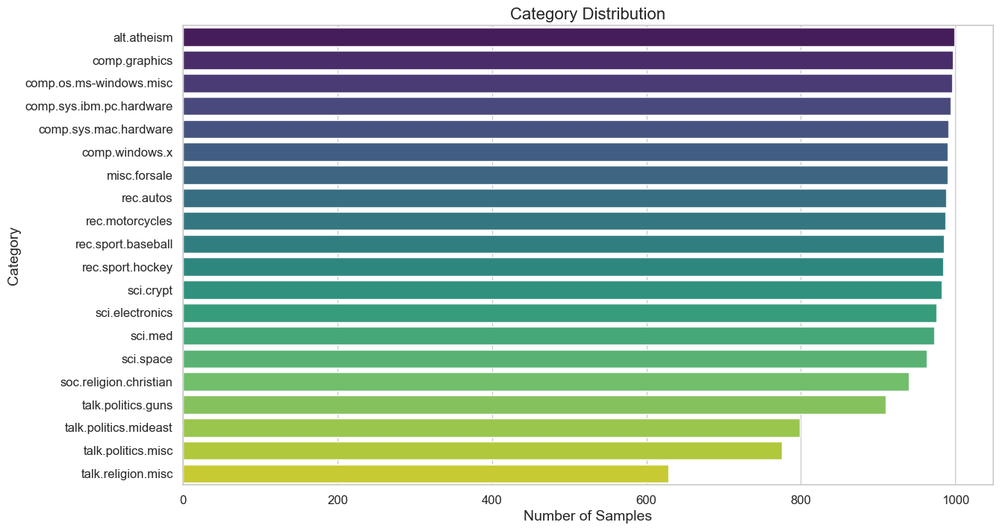

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

##########标签类别可视化分析###############

df = pd.DataFrame({'Category': label_names, 'Count': pd.Series(label).value_counts()})

plt.figure(figsize=(14, 8))
sns.set_theme(style="whitegrid")
sns.barplot(x='Count', y='Category', data=df, palette='viridis')
plt.title('Category Distribution', fontsize=16)
plt.xlabel('Number of Samples', fontsize=14)
plt.ylabel('Category', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

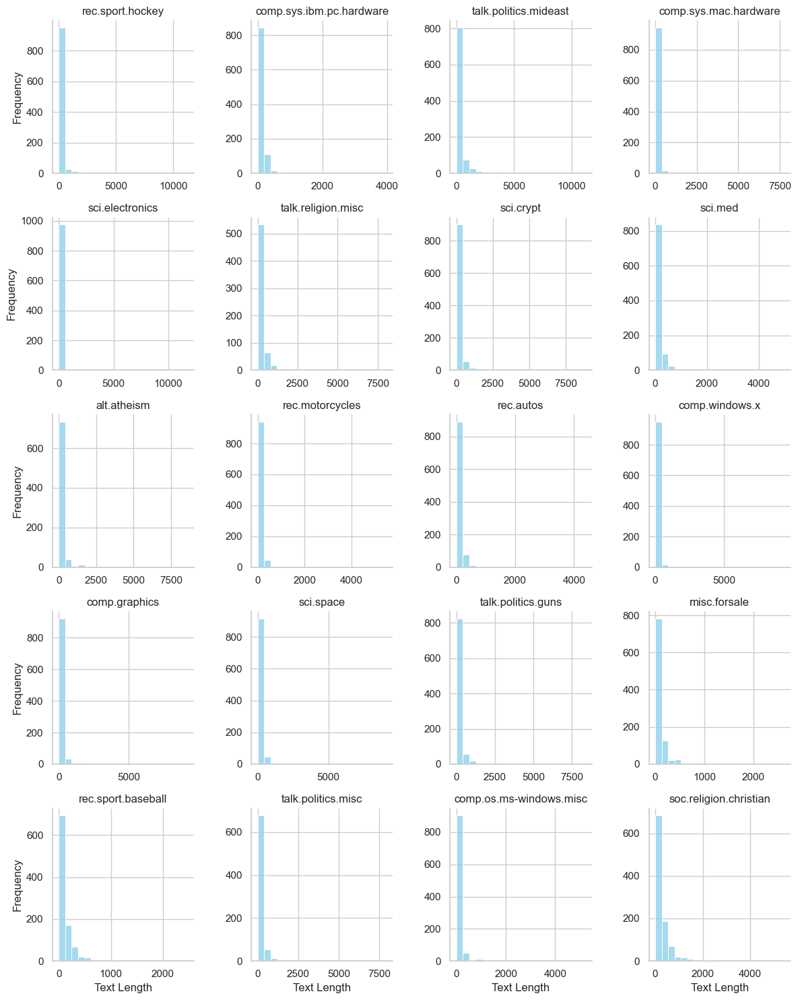

In [5]:
########文本长度分析##########
text_lengths = [len(text.split()) for text in data]

# 创建一个新的 DataFrame
df = pd.DataFrame({'Category': [label_names[i] for i in label], 'Text Length': text_lengths})

# 使用 FacetGrid 可视化文本长度分布
g = sns.FacetGrid(df, col='Category', col_wrap=4, height=3, sharex=False, sharey=False)
g.map(sns.histplot, 'Text Length', bins=20, color='skyblue')
g.set_titles(col_template="{col_name}", row_template="{row_name}")
g.set_axis_labels('Text Length', 'Frequency')
plt.show()

[nltk_data] Downloading package wordnet to /Users/hannnli/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/hannnli/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


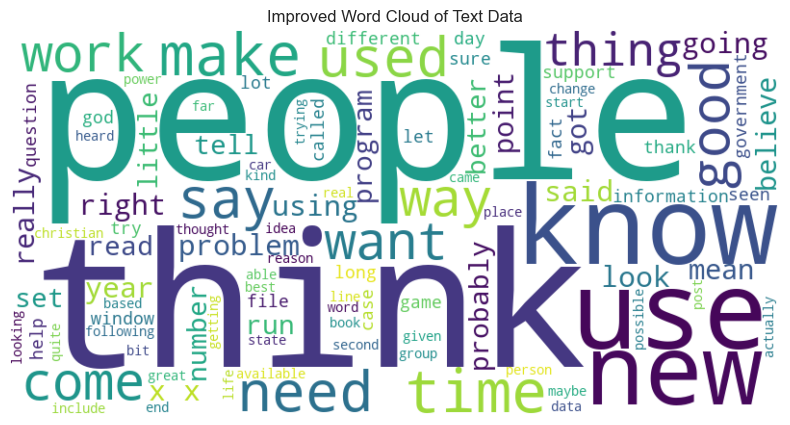

In [15]:
############词频分析#######################
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.datasets import fetch_20newsgroups
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk

# 下载必要的NLTK资源
nltk.download('wordnet')
nltk.download('stopwords')

# 初始化词形还原器
lemmatizer = WordNetLemmatizer()

# 合并自定义停用词
custom_stopwords = set(STOPWORDS).union(set(ENGLISH_STOP_WORDS)).union(set(stopwords.words('english')))

# 预处理文本
def preprocess_text(text):
    words = text.split()
    words = [lemmatizer.lemmatize(word.lower()) for word in words if word.lower() not in custom_stopwords and word.isalpha()]
    return ' '.join(words)

# 处理所有文本
all_words = ' '.join(preprocess_text(text) for text in data)

# 生成词云
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=100).generate(all_words)

# 显示词云
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Improved Word Cloud of Text Data')
plt.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

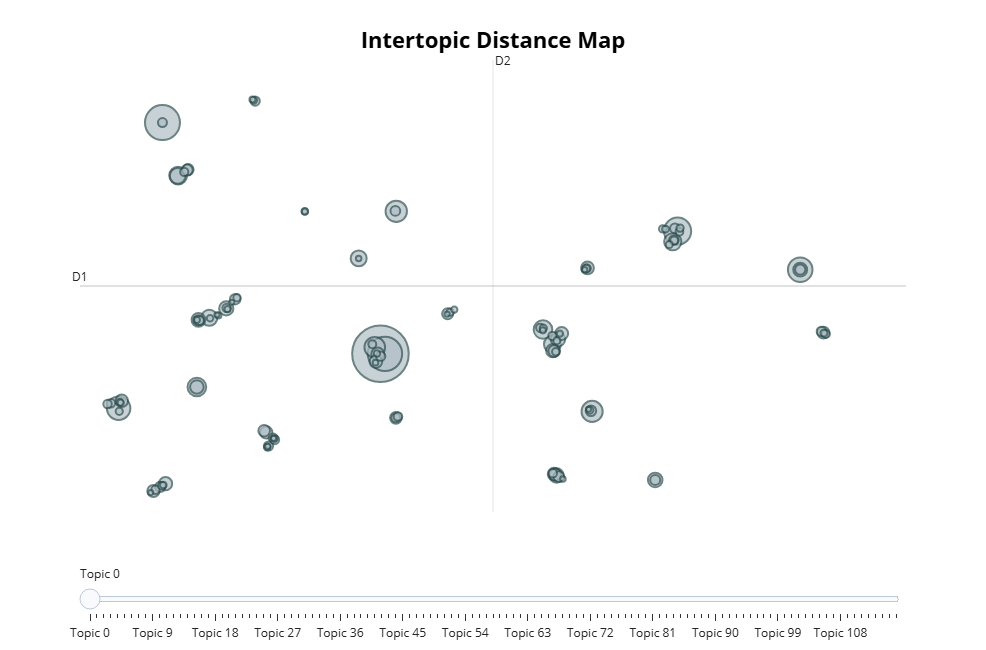

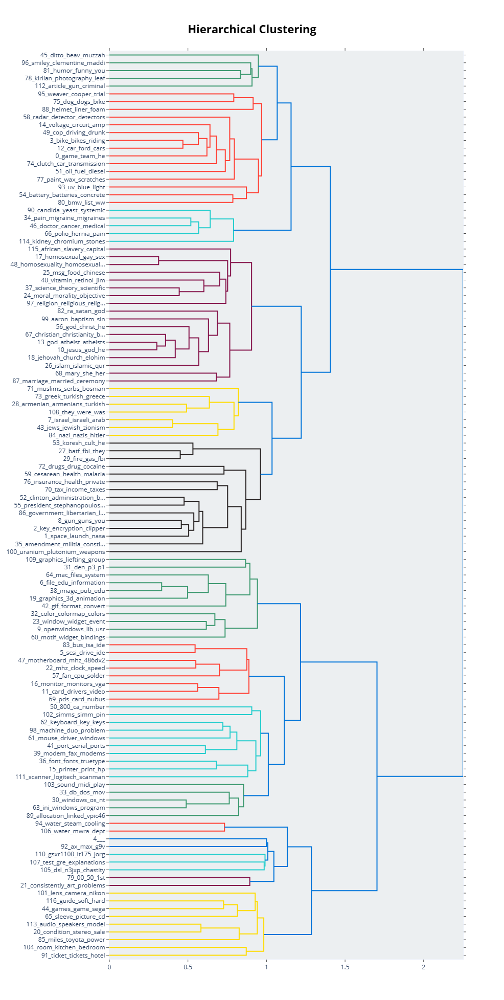

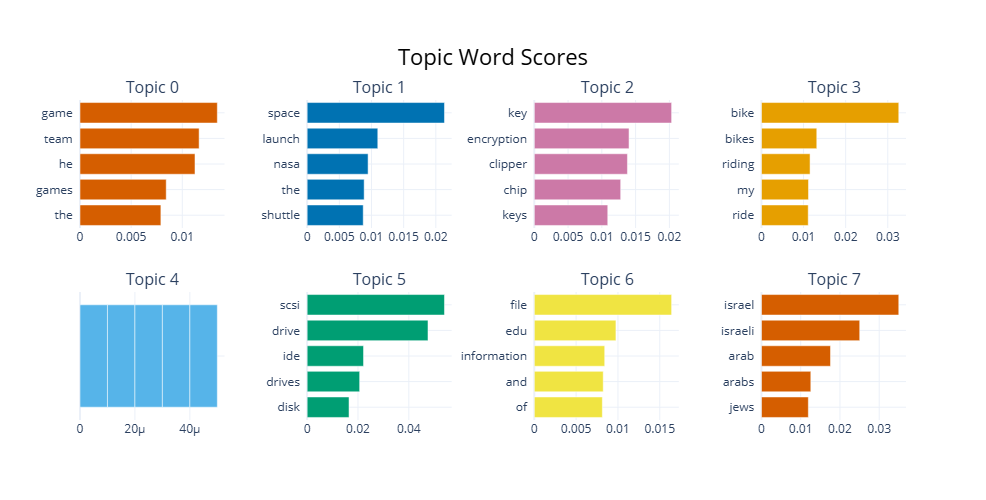

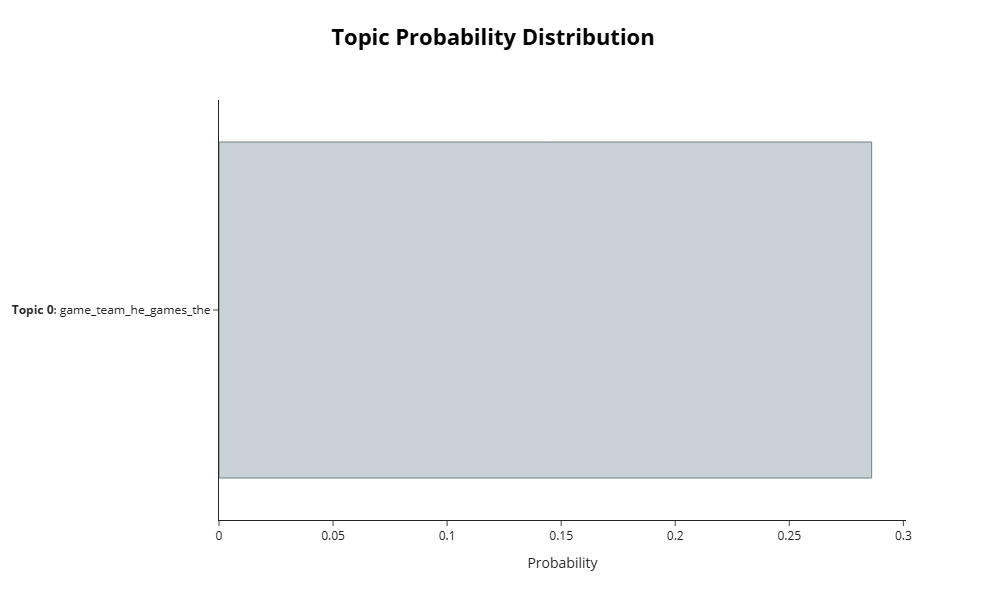

In [5]:
#使用BERTopic进行交互式主题分布可视化
# 创建并训练BERTopic模型
import umap
import hdbscan
from sentence_transformers import SentenceTransformer

# 使用并行化的UMAP和HDBSCAN
umap_model = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', n_jobs=-1)
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True, core_dist_n_jobs=-1)

embedding_model = SentenceTransformer("paraphrase-MiniLM-L6-v2")
topic_model = BERTopic(umap_model=umap_model, hdbscan_model=hdbscan_model,embedding_model=embedding_model,calculate_probabilities=True)


topics, probs = topic_model.fit_transform(data)
# 可视化主题分布，展示所有主题的分布情况，气泡的大小表示该主题的文档数量，气泡的位置表示主题之间的相似性。
fig = topic_model.visualize_topics()
fig.show()
# 展示主题之间的层次结构和相似性。
fig = topic_model.visualize_hierarchy()
fig.show()
# 展示每个主题的关键词，每个主题对应一个条形图，显示该主题的关键词及其权重。权重越高的词在该主题中越重要。
fig = topic_model.visualize_barchart()
fig.show()
# 展示单个文档在不同主题上的概率分布。
fig = topic_model.visualize_distribution(probs[0])
fig.show()

In [11]:
class News20Dataset(Dataset):
    def __init__(self,tokenizer=None,max_length=256,transforms=None):
        self.raw_dataset = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))
        self.data = self.raw_dataset["data"]
        self.label = self.raw_dataset["target"]
        self.label_name = self.raw_dataset["target_names"]
        self.tokenizer = tokenizer
        self.max_length = max_length
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        text = self.data[idx]
        encode_text = self.tokenizer(text, truncation=True, padding='max_length', max_length=self.max_length, return_tensors="pt")
        return encode_text,text,self.label[idx]
def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0]
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)
def cls_pooling(model_output):
    return model_output.last_hidden_state[:, 0, :]

In [42]:
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")

from transformers import AutoModel
from transformers import AutoTokenizer, AutoModel,DistilBertTokenizer, DistilBertModel

# 基于Jina模型生成嵌入向量
jina_tokenizer = AutoTokenizer.from_pretrained('jinaai/jina-embeddings-v2-small-en')
jina_model = AutoModel.from_pretrained('jinaai/jina-embeddings-v2-small-en', trust_remote_code=True).to(device)


#基于DistilBERT模型生成嵌入向量
distilbert_tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-cased')
distilbert_model = DistilBertModel.from_pretrained('distilbert-base-cased').to(device)

# 创建数据集和数据加载器
jina_dataset = News20Dataset(jina_tokenizer)
distilbert_dataset = News20Dataset(distilbert_tokenizer)

jina_loader = DataLoader(jina_dataset, batch_size=64)
distilbert_loader = DataLoader(distilbert_dataset, batch_size=64)


# 生成嵌入
def generate_embeddings(model, loader, pooling_method):
    embeddings_all = []
    with torch.no_grad():
        for batch in loader:
            encode_text, text, label = batch
            input_ids = encode_text["input_ids"].squeeze().to(device)
            attention_mask = encode_text["attention_mask"].squeeze().to(device)
            model_output = model(input_ids=input_ids, attention_mask=attention_mask)
            embeddings = pooling_method(model_output, attention_mask) if pooling_method == mean_pooling else pooling_method(model_output)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            embeddings_all.append(embeddings)
    return torch.cat(embeddings_all, dim=0)

# 生成Jina和DistilBERT的嵌入
jina_mean_embeddings = generate_embeddings(jina_model, jina_loader, mean_pooling)
jina_cls_embeddings = generate_embeddings(jina_model, jina_loader, cls_pooling)

distilbert_mean_embeddings = generate_embeddings(distilbert_model, distilbert_loader, mean_pooling)
distilbert_cls_embeddings = generate_embeddings(distilbert_model, distilbert_loader, cls_pooling)

# 保存嵌入到文件
np.save('embeddings/jina_mean_embeddings.npy', jina_mean_embeddings.numpy())
np.save('embeddings/jina_cls_embeddings.npy', jina_cls_embeddings.numpy())
np.save('embeddings/distilbert_mean_embeddings.npy', distilbert_mean_embeddings.numpy())
np.save('embeddings/distilbert_cls_embeddings.npy', distilbert_cls_embeddings.numpy())


In [7]:
jina_mean_embeddings = np.load('embeddings/jina_mean_embeddings.npy')
jina_cls_embeddings = np.load('embeddings/jina_cls_embeddings.npy')
distilbert_mean_embeddings = np.load('embeddings/distilbert_mean_embeddings.npy')
distilbert_cls_embeddings = np.load('embeddings/distilbert_cls_embeddings.npy')

In [23]:
from sklearn.manifold import TSNE
# 定义t-SNE降维和可视化函数
def tsne_and_plot(embeddings, labels, title):
    tsne = TSNE(n_components=2, perplexity=5, learning_rate=500, n_iter=3000, early_exaggeration=15, random_state=42)
    embeddings_2d = tsne.fit_transform(embeddings)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x=embeddings_2d[:, 0], y=embeddings_2d[:, 1], c=labels,cmap='coolwarm')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

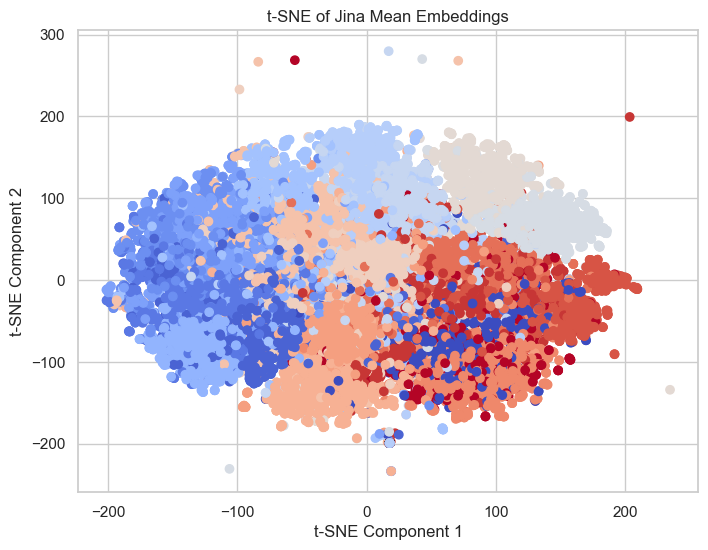

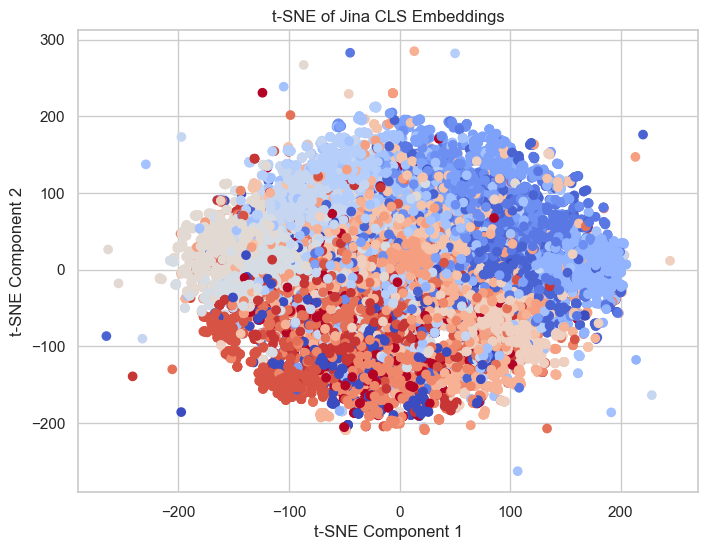

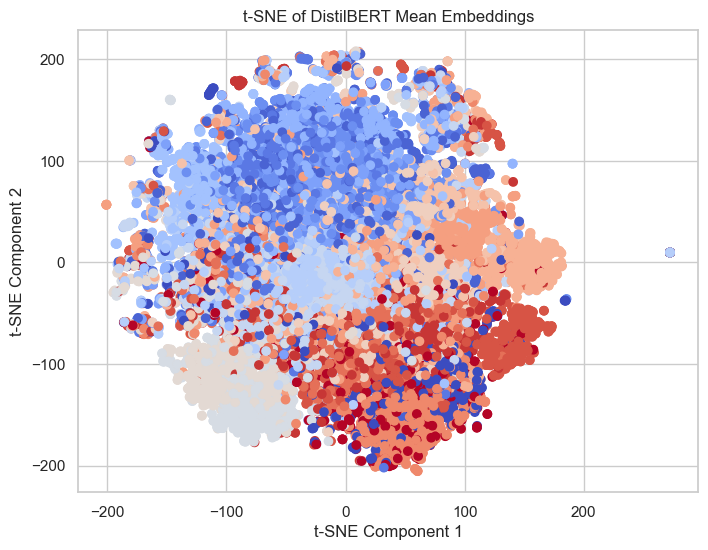

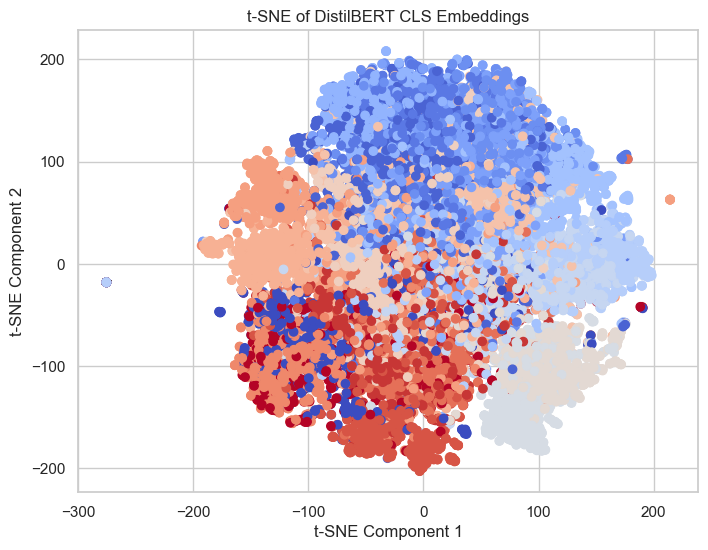

In [24]:
#对每种嵌入进行t-SNE降维并可视化
tsne_and_plot(jina_mean_embeddings, jina_dataset.label, "t-SNE of Jina Mean Embeddings")
tsne_and_plot(jina_cls_embeddings, jina_dataset.label, "t-SNE of Jina CLS Embeddings")
tsne_and_plot(distilbert_mean_embeddings, distilbert_dataset.label, "t-SNE of DistilBERT Mean Embeddings")
tsne_and_plot(distilbert_cls_embeddings, distilbert_dataset.label, "t-SNE of DistilBERT CLS Embeddings")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


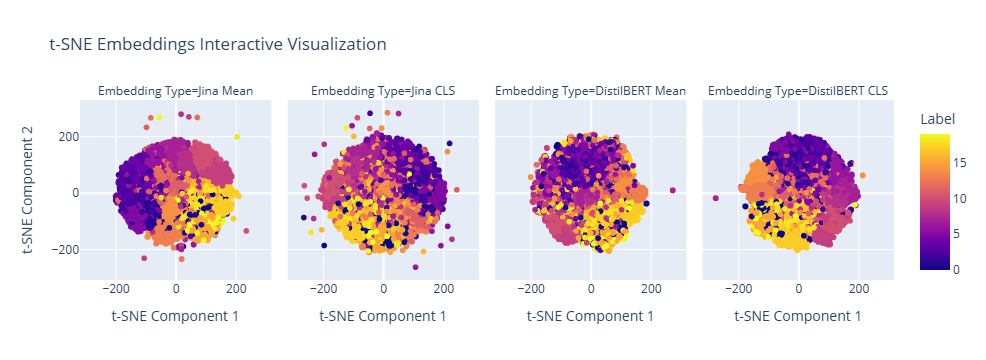

In [14]:
#######降维嵌入向量交互式可视化####################

from sklearn.manifold import TSNE
import plotly.express as px

# 假设您有四种嵌入向量
# jina_mean_embeddings, jina_cls_embeddings, distilbert_mean_embeddings, distilbert_cls_embeddings

# 使用t-SNE将每种嵌入降维到二维
tsne = TSNE(n_components=2, perplexity=5, learning_rate=500, n_iter=3000, early_exaggeration=15, random_state=42)

jina_mean_2d = tsne.fit_transform(jina_mean_embeddings)
jina_cls_2d = tsne.fit_transform(jina_cls_embeddings)
distilbert_mean_2d = tsne.fit_transform(distilbert_mean_embeddings)
distilbert_cls_2d = tsne.fit_transform(distilbert_cls_embeddings)

# 创建DataFrame
df_jina_mean = pd.DataFrame(jina_mean_2d, columns=['Component 1', 'Component 2'])
df_jina_mean['Label'] = jina_dataset.label
df_jina_mean['Embedding Type'] = 'Jina Mean'

df_jina_cls = pd.DataFrame(jina_cls_2d, columns=['Component 1', 'Component 2'])
df_jina_cls['Label'] = jina_dataset.label
df_jina_cls['Embedding Type'] = 'Jina CLS'

df_distilbert_mean = pd.DataFrame(distilbert_mean_2d, columns=['Component 1', 'Component 2'])
df_distilbert_mean['Label'] = distilbert_dataset.label
df_distilbert_mean['Embedding Type'] = 'DistilBERT Mean'

df_distilbert_cls = pd.DataFrame(distilbert_cls_2d, columns=['Component 1', 'Component 2'])
df_distilbert_cls['Label'] = distilbert_dataset.label
df_distilbert_cls['Embedding Type'] = 'DistilBERT CLS'

# 合并所有DataFrame
df_all = pd.concat([df_jina_mean, df_jina_cls, df_distilbert_mean, df_distilbert_cls], ignore_index=True)

# 使用Plotly绘制交互式散点图
fig = px.scatter(df_all, x='Component 1', y='Component 2', color='Label', 
                 facet_col='Embedding Type',  # 使用facet_col创建子图
                 title='t-SNE Embeddings Interactive Visualization',
                 labels={'Component 1': 't-SNE Component 1', 'Component 2': 't-SNE Component 2'},
                 hover_data=['Label'])

# 显示图表
fig.show()